<a href="https://colab.research.google.com/github/wksiazak/Clinical-Trials---NLP-project/blob/master/NLP_clinical_trails.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Based on Completed 1000 trials from this page https://www.clinicaltrials.gov/search?viewType=Table&limit=100&aggFilters=status:com


## Data preparation

In [1]:
import json
import pandas as pd
import re

In [3]:
with open('ctg-studies_v3.json', 'r') as f:
    data_loaded = json.load(f)
print(data_loaded)

[{'protocolSection': {'identificationModule': {'nctId': 'NCT06681831', 'orgStudyIdInfo': {'id': '864/16'}, 'organization': {'fullName': 'Fondazione Policlinico Universitario Agostino Gemelli IRCCS', 'class': 'OTHER'}, 'briefTitle': 'Single-Port Hysterectomy (R-SPH) Using the Da Vinci SP System in Low-Risk Endometrial Cancer', 'officialTitle': 'Feasibility, Safety, and Efficacy of Robotic Single-Port Hysterectomy (R-SPH) Using the Da Vinci SP System in Low-Risk Endometrial Cancer: a Pilot Study'}, 'statusModule': {'statusVerifiedDate': '2024-11', 'overallStatus': 'COMPLETED', 'expandedAccessInfo': {'hasExpandedAccess': False}, 'startDateStruct': {'date': '2024-06-26', 'type': 'ACTUAL'}, 'primaryCompletionDateStruct': {'date': '2024-10-01', 'type': 'ACTUAL'}, 'completionDateStruct': {'date': '2024-10-15', 'type': 'ACTUAL'}, 'studyFirstSubmitDate': '2024-11-04', 'studyFirstSubmitQcDate': '2024-11-07', 'studyFirstPostDateStruct': {'date': '2024-11-08', 'type': 'ESTIMATED'}, 'lastUpdateSubm

In [4]:
df = pd.json_normalize(data_loaded)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 98 columns):
 #   Column                                                                               Non-Null Count  Dtype 
---  ------                                                                               --------------  ----- 
 0   hasResults                                                                           1000 non-null   bool  
 1   protocolSection.identificationModule.nctId                                           1000 non-null   object
 2   protocolSection.identificationModule.orgStudyIdInfo.id                               1000 non-null   object
 3   protocolSection.identificationModule.organization.fullName                           1000 non-null   object
 4   protocolSection.identificationModule.organization.class                              1000 non-null   object
 5   protocolSection.identificationModule.briefTitle                                      1000 non-null

In [6]:
pd.set_option('display.max_rows', None)
df.isna().sum().sort_values()

,0
hasResults,0
protocolSection.statusModule.lastUpdateSubmitDate,0
protocolSection.statusModule.lastUpdatePostDateStruct.date,0
protocolSection.statusModule.lastUpdatePostDateStruct.type,0
protocolSection.sponsorCollaboratorsModule.responsibleParty.type,0
derivedSection.miscInfoModule.versionHolder,0
protocolSection.eligibilityModule.stdAges,0
protocolSection.statusModule.studyFirstPostDateStruct.type,0
protocolSection.eligibilityModule.sex,0
protocolSection.sponsorCollaboratorsModule.leadSponsor.class,0


Usuwam kolumny z oryginalnego df, gdzie pustych jest więcej niż 990, czyli 6 kolumn

In [7]:
df = df.loc[:, df.isna().sum() <= 990]

Let's try to shorten names of columns

In [8]:
# Automatyczne usunięcie prefiksów, takich jak 'protocolSection.'
df.columns = df.columns.str.replace(r'protocolSection\.|resultsSection\.|derivedSection\.', '', regex=True)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 92 columns):
 #   Column                                                               Non-Null Count  Dtype 
---  ------                                                               --------------  ----- 
 0   hasResults                                                           1000 non-null   bool  
 1   identificationModule.nctId                                           1000 non-null   object
 2   identificationModule.orgStudyIdInfo.id                               1000 non-null   object
 3   identificationModule.organization.fullName                           1000 non-null   object
 4   identificationModule.organization.class                              1000 non-null   object
 5   identificationModule.briefTitle                                      1000 non-null   object
 6   identificationModule.officialTitle                                   1000 non-null   object
 7   statusModule.sta

In [10]:
pd.options.display.max_rows = None
pd.options.display.max_colwidth = None

In [11]:
df.head()

,hasResults,identificationModule.nctId,identificationModule.orgStudyIdInfo.id,identificationModule.organization.fullName,identificationModule.organization.class,identificationModule.briefTitle,identificationModule.officialTitle,statusModule.statusVerifiedDate,statusModule.overallStatus,statusModule.expandedAccessInfo.hasExpandedAccess,...,documentSection.largeDocumentModule.largeDocs,identificationModule.secondaryIdInfos,designModule.designInfo.interventionModelDescription,designModule.designInfo.maskingInfo.maskingDescription,identificationModule.acronym,designModule.bioSpec.retention,designModule.bioSpec.description,outcomesModule.otherOutcomes,referencesModule.seeAlsoLinks,ipdSharingStatementModule.url
0,False,NCT06681831,864/16,Fondazione Policlinico Universitario Agostino Gemelli IRCCS,OTHER,Single-Port Hysterectomy (R-SPH) Using the Da Vinci SP System in Low-Risk Endometrial Cancer,"Feasibility, Safety, and Efficacy of Robotic Single-Port Hysterectomy (R-SPH) Using the Da Vinci SP System in Low-Risk Endometrial Cancer: a Pilot Study",2024-11,COMPLETED,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,False,NCT06681805,36264PR752/7/24,Kafrelsheikh University,OTHER,Prophylactic Mirtazapine and Different Doses of Intrathecal Morphine in Preventing Nausea and Vomiting After Cesarean Section,Role of Prophylactic Mirtazapine and Different Doses of Intrathecal Morphine in Preventing Nausea and Vomiting After Cesarean Section: A Randomized Controlled Trial,2024-11,COMPLETED,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,False,NCT06681727,PD pilot,Region Stockholm,OTHER_GOV,Feasibility of Accessible Video Mental Healthcare Triage and Assessment - A Clinical Pilot Study,Feasibility of Accessible Video Mental Healthcare Triage and Assessment - A Clinical Pilot Study,2024-08,COMPLETED,False,...,"[{'typeAbbrev': 'ICF', 'hasProtocol': False, 'hasSap': False, 'hasIcf': True, 'label': 'Informed Consent Form', 'date': '2022-08-22', 'uploadDate': '2024-08-23T09:45', 'filename': 'ICF_000.pdf', 'size': 171392}]",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,False,NCT06681675,2023/671,Selcuk University,OTHER,The Effect of the Intrapartum Care Model Given in Line With WHO Recommendations on the Birth Process and Care,"The Effect of the Intrapartum Care Model Given in Line With WHO Recommendations on Labor Pain, Fear, Comfort, Duration, Oxytocin Use and Midwifery Care Perception: A Randomized Controlled Trial",2024-11,COMPLETED,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,False,NCT06681597,I-MRER [2023] No. 68,Nanchang University,OTHER,Raspberry Ketone Intake Upregulates Circulating FGF21 and Induces Energy Expenditure in Humans,The Effect of Raspberry Ketone Intake on Plasma FGF21 Levels,2023-11,COMPLETED,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [12]:
pd.options.display.max_rows = None
pd.options.display.max_colwidth = None

Sprawdzam, które kolumny mają zagnieżdżone struktury

In [13]:
# Lista kolumn, które zawierają zagnieżdżone struktury
nested_columns = [col for col in df.columns if df[col].apply(lambda x: isinstance(x, (dict, list))).any()]

print("Kolumny z zagnieżdżonymi danymi:")
for col in nested_columns:
    print(col)

Kolumny z zagnieżdżonymi danymi:
conditionsModule.conditions
conditionsModule.keywords
designModule.phases
armsInterventionsModule.interventions
outcomesModule.primaryOutcomes
eligibilityModule.stdAges
contactsLocationsModule.locations
referencesModule.references
conditionBrowseModule.meshes
conditionBrowseModule.ancestors
conditionBrowseModule.browseLeaves
conditionBrowseModule.browseBranches
designModule.designInfo.maskingInfo.whoMasked
armsInterventionsModule.armGroups
outcomesModule.secondaryOutcomes
ipdSharingStatementModule.infoTypes
interventionBrowseModule.meshes
interventionBrowseModule.ancestors
interventionBrowseModule.browseLeaves
interventionBrowseModule.browseBranches
sponsorCollaboratorsModule.collaborators
contactsLocationsModule.overallOfficials
documentSection.largeDocumentModule.largeDocs
identificationModule.secondaryIdInfos
outcomesModule.otherOutcomes
referencesModule.seeAlsoLinks


Spróbujemy wypłaszczyć dane

In [14]:
import pandas as pd

def flatten_dataframe(df):
    """
    Funkcja do iteracyjnego spłaszczania kolumn DataFrame, dopóki nie pozostaną żadne zagnieżdżone struktury.
    """
    while True:
        # Sprawdza, które kolumny zawierają zagnieżdżone struktury
        nested_columns = [col for col in df.columns if df[col].apply(lambda x: isinstance(x, (dict, list))).any()]

        # Kończy pętlę, jeśli brak zagnieżdżonych kolumn
        if not nested_columns:
            break

        # Iteracja przez każdą kolumnę do spłaszczenia
        for col in nested_columns:
            # Spłaszcza zagnieżdżoną kolumnę, obsługując NaN, gdzie `pd.json_normalize` pomija te wartości
            expanded_df = pd.json_normalize(df[col].dropna())

            # Dodaje prefiks, aby oznaczyć kolumnę źródłową
            expanded_df.columns = [f"{col}_{subcol}" for subcol in expanded_df.columns]

            # Włączenie nowych kolumn do oryginalnego df, a usunięcie starej kolumny
            df = df.drop(columns=[col]).join(expanded_df, how='left')

    return df

# Użycie funkcji
df_flat_2 = flatten_dataframe(df)
#print(df_flat_2.head())


In [15]:
# Sprawdzam, czy są jeszcze zagnieżdzone strultury
check_nested_columns = [col for col in df_flat_2.columns if df_flat_2[col].apply(lambda x: isinstance(x, (dict, list))).any()]

print("Kolumny z zagnieżdżonymi danymi:")
for col in check_nested_columns:
    print(col)

Kolumny z zagnieżdżonymi danymi:


In [16]:
df_flat_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Columns: 2030 entries, hasResults to referencesModule.seeAlsoLinks_26_url
dtypes: bool(1), float64(84), int64(1), object(1944)
memory usage: 15.5+ MB


Otrzymalismy plaski plik z 2027 kolumanami, mozemy to wyeksportować do csv

In [17]:
df_flat_2.to_csv("overview_columns.csv", index=True)

In [18]:
df_flat_2.isna().sum().sort_values()

,0
hasResults,0
statusModule.studyFirstPostDateStruct.type,0
statusModule.lastUpdateSubmitDate,0
statusModule.lastUpdatePostDateStruct.date,0
statusModule.lastUpdatePostDateStruct.type,0
sponsorCollaboratorsModule.responsibleParty.type,0
sponsorCollaboratorsModule.leadSponsor.name,0
statusModule.studyFirstPostDateStruct.date,0
sponsorCollaboratorsModule.leadSponsor.class,0
designModule.studyType,0


## creating smaller df for selected columns

In [20]:
lista_kolumn = pd.read_csv('/content/selected_columns_2.csv')

# Wydziel listę kolumn z wybranej kolumny po jej nazwie, np. "column_name"
# Zastąp "column_name" rzeczywistą nazwą kolumny w pliku CSV
kolumny_do_wydzielenia = lista_kolumn['columns'].tolist()

In [21]:
df_selected_columns = df_flat_2[kolumny_do_wydzielenia]

In [22]:
df_selected_columns.head()

,identificationModule.nctId,identificationModule.orgStudyIdInfo.id,identificationModule.organization.fullName,identificationModule.organization.class,identificationModule.briefTitle,identificationModule.officialTitle,statusModule.lastUpdatePostDateStruct.type,sponsorCollaboratorsModule.responsibleParty.type,sponsorCollaboratorsModule.leadSponsor.name,sponsorCollaboratorsModule.leadSponsor.class,...,armsInterventionsModule.interventions_0_name,armsInterventionsModule.interventions_0_description,outcomesModule.primaryOutcomes_0_measure,contactsLocationsModule.locations_0_facility,contactsLocationsModule.locations_0_city,contactsLocationsModule.locations_0_country,conditionBrowseModule.browseLeaves_0_name,conditionBrowseModule.browseBranches_0_name,armsInterventionsModule.armGroups_0_label,outcomesModule.secondaryOutcomes_0_measure
0,NCT06681831,864/16,Fondazione Policlinico Universitario Agostino Gemelli IRCCS,OTHER,Single-Port Hysterectomy (R-SPH) Using the Da Vinci SP System in Low-Risk Endometrial Cancer,"Feasibility, Safety, and Efficacy of Robotic Single-Port Hysterectomy (R-SPH) Using the Da Vinci SP System in Low-Risk Endometrial Cancer: a Pilot Study",ESTIMATED,PRINCIPAL_INVESTIGATOR,Fondazione Policlinico Universitario Agostino Gemelli IRCCS,OTHER,...,DaVinci SP,robotic single-port hysterectomy (R-SPH) with DaVinci SP,Operative Time,IRCCS regina elena cancer istitute,Rome,Italy,Endometrial Neoplasms,Neoplasms,Groups I,Degree of pain
1,NCT06681805,36264PR752/7/24,Kafrelsheikh University,OTHER,Prophylactic Mirtazapine and Different Doses of Intrathecal Morphine in Preventing Nausea and Vomiting After Cesarean Section,Role of Prophylactic Mirtazapine and Different Doses of Intrathecal Morphine in Preventing Nausea and Vomiting After Cesarean Section: A Randomized Controlled Trial,ESTIMATED,PRINCIPAL_INVESTIGATOR,Kafrelsheikh University,OTHER,...,Mirtazapine + Bupivacaine + Morphine,Patients received 30mg of oral mirtazapine one hour before surgery plus 10 mg of bupivacaine 0.5% along with 0.2 mg of morphine.,Incidence of postoperative nausea and vomiting,Kafrelsheikh University,Kafr Ash Shaykh,Egypt,Nausea,Symptoms and General Pathology,Patients,Medical records
2,NCT06681727,PD pilot,Region Stockholm,OTHER_GOV,Feasibility of Accessible Video Mental Healthcare Triage and Assessment - A Clinical Pilot Study,Feasibility of Accessible Video Mental Healthcare Triage and Assessment - A Clinical Pilot Study,ESTIMATED,SPONSOR,Region Stockholm,OTHER_GOV,...,Accessible Video Mental Healthcare Triage and Assessment (IP),Patients aged 18 years and older who were registered at participating primary care centers were eligible to access the IP through a regional healthcare app. IP comprised a brief digital screening followed by a 45-minute video consultation with a mental health professional. Eligible patients could thereafter schedule appointments at cooperating healthcare centers and clinics through the app used for video consultations.,Patient characteristics,Psychiatry Southwest,Stockholm,Sweden,Mental Disorders,Behaviors and Mental Disorders,Placebo group,Pupil diameter
3,NCT06681675,2023/671,Selcuk University,OTHER,The Effect of the Intrapartum Care Model Given in Line With WHO Recommendations on the Birth Process and Care,"The Effect of the Intrapartum Care Model Given in Line With WHO Recommendations on Labor Pain, Fear, Comfort, Duration, Oxytocin Use and Midwifery Care Perception: A Randomized Controlled Trial",ESTIMATED,PRINCIPAL_INVESTIGATOR,Selcuk University,OTHER,...,The group that applied the Intrapartum Care Model,"In pregnant women with cervical dilatation of 5 cm, the Personal Information Form was completed at the initial clinic admission.\n\n•The Intrapartum Care Model was implemented for all primiparous pregnant women assigned to the intervention group during labor and after delivery by the researcher midwife, in accordance with the World Health Organization's positive birth recommendations.\n\nData were collected usi

## cleaning new df with selected columns

In [23]:
import pandas as pd
import re
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk

# Pobierz stopwords z NLTK (tylko raz)
nltk.download('stopwords')
nltk.download('punkt')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [24]:
import re

# Funkcja do czyszczenia tekstu
def clean_text(text):
    if isinstance(text, str):  # Sprawdzenie, czy wartość jest typu string
        text = text.lower()  # Konwersja do małych liter
        text = re.sub(r'\d+', '', text)  # Usunięcie cyfr
        text = re.sub(r'\W+', ' ', text)  # Usunięcie znaków specjalnych
        text = re.sub(r'\s+', ' ', text)  # Usunięcie dodatkowych spacji
        return text.strip()
    return text  # Zwrot oryginalnej wartości, jeśli nie jest typu string

# Zastosowanie clean_text na wszystkich kolumnach typu object
for col in df_selected_columns.select_dtypes(include=['object']).columns:
    df_selected_columns[col] = df_selected_columns[col].apply(clean_text)

<ipython-input-24-fb9c119d083a>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_columns[col] = df_selected_columns[col].apply(clean_text)


usuwanie stop wordsów

In [25]:
import pandas as pd
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk

# Pobranie zasobów NLTK
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('punkt_tab')

# Definiowanie stopwords dla języka angielskiego
stop_words = set(stopwords.words('english'))

# Funkcja do usuwania stopwords
def remove_stopwords(text):
    if isinstance(text, str):  # Sprawdzenie, czy wartość jest typu string
        tokens = word_tokenize(text)
        filtered_tokens = [word for word in tokens if word.lower() not in stop_words]
        return ' '.join(filtered_tokens)
    return text  # Zwrot oryginalnej wartości, jeśli nie jest typu string

# Załadowanie danych (upewnij się, że df_selected_columns istnieje)
# df_selected_columns = pd.read_csv("twoj_plik.csv")  # Przykładowe wczytanie pliku CSV

# Zastosowanie remove_stopwords na wszystkich kolumnach typu object
for col in df_selected_columns.select_dtypes(include=['object']).columns:
    df_selected_columns[col] = df_selected_columns[col].apply(remove_stopwords)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
<ipython-input-25-b13c6b938ff4>:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_columns[col] = df_selected_columns[col].apply(remove_stopwords)


## WordCloud

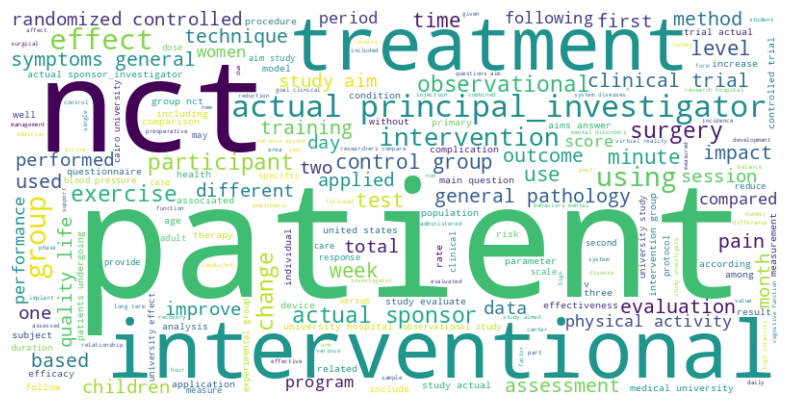

In [26]:
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Załadowanie danych do DataFrame
# Zakładamy, że DataFrame `df` zawiera wiele kolumn tekstowych

# 1. Łączenie tekstu z wszystkich kolumn w jeden dokument (jeden ciąg tekstowy)
text = ' '.join(df_selected_columns.apply(lambda row: ' '.join(row.dropna().astype(str)), axis=1))

# 2. Tworzenie chmury słów
wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis', max_words=200).generate(text)

# 3. Wyświetlanie chmury słów
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [27]:
df_selected_columns.isna().sum()

,0
identificationModule.nctId,0
identificationModule.orgStudyIdInfo.id,0
identificationModule.organization.fullName,0
identificationModule.organization.class,0
identificationModule.briefTitle,0
identificationModule.officialTitle,0
statusModule.lastUpdatePostDateStruct.type,0
sponsorCollaboratorsModule.responsibleParty.type,0
sponsorCollaboratorsModule.leadSponsor.name,0
sponsorCollaboratorsModule.leadSponsor.class,0


In [28]:
# Uzupełnianie braków w kolumnach tekstowych pustymi ciągami
df_selected_columns_2 = df_selected_columns.copy()
for col in df_selected_columns.select_dtypes(include=['object']).columns:
    df_selected_columns[col].fillna("", inplace=True)

# Uzupełnianie braków w kolumnach liczbowych średnią (lub inną wartością)
#for col in df_selected_columns.select_dtypes(include=['float', 'int']).columns:
    #df_selected_columns[col].fillna(df_selected_columns[col].mean(), inplace=True)

<ipython-input-28-2666de8c5b1f>:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_selected_columns[col].fillna("", inplace=True)
<ipython-input-28-2666de8c5b1f>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_columns[col].fillna("", inplace=True)


In [29]:
df_selected_columns.isna().sum()

,0
identificationModule.nctId,0
identificationModule.orgStudyIdInfo.id,0
identificationModule.organization.fullName,0
identificationModule.organization.class,0
identificationModule.briefTitle,0
identificationModule.officialTitle,0
statusModule.lastUpdatePostDateStruct.type,0
sponsorCollaboratorsModule.responsibleParty.type,0
sponsorCollaboratorsModule.leadSponsor.name,0
sponsorCollaboratorsModule.leadSponsor.class,0


## TF IDF

Streaming output truncated to the last 5000 lines.
biomarker    0.198684
type         0.191534
Name: 444, dtype: float64


Najważniejsze słowa dla dokumentu 446 (ID: nct):
prolapse    0.417497
pelvic      0.367854
organ       0.340885
descent     0.325163
vagina      0.172261
Name: 445, dtype: float64


Najważniejsze słowa dla dokumentu 447 (ID: nct):
retraction    0.422296
masse         0.321535
anterior      0.247590
en            0.231964
teeth         0.209773
Name: 446, dtype: float64


Najważniejsze słowa dla dokumentu 448 (ID: nct):
contrast     0.453855
medium       0.334604
oil          0.301420
infertile    0.292075
based        0.258746
Name: 447, dtype: float64


Najważniejsze słowa dla dokumentu 449 (ID: nct):
media            0.482341
eating           0.406406
social           0.403506
fears            0.240504
empagliflozin    0.160336
Name: 448, dtype: float64


Najważniejsze słowa dla dokumentu 450 (ID: nct):
malocclusion    0.365144
orthodontic     0.337848
class     

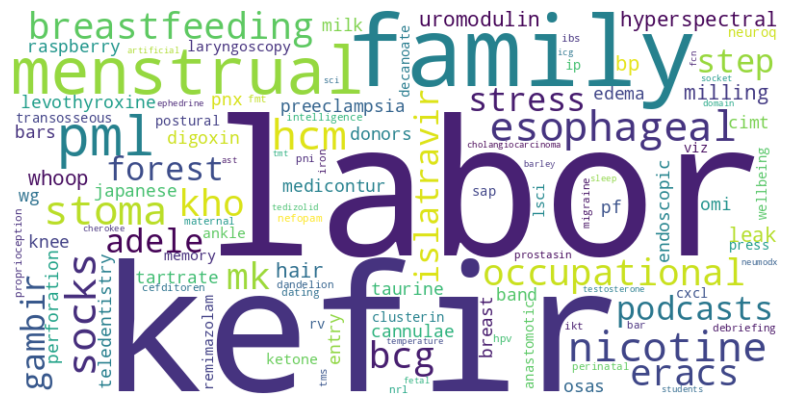

In [30]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Zakładamy, że `df_selected_columns` to DataFrame z kolumną 'identificationModule.briefTitle'
ids_selected = df_selected_columns['identificationModule.nctId']
docs_selected = df_selected_columns.drop(columns=['identificationModule.nctId'])

# Tworzymy obiekt TfidfVectorizer
tfidf_vectorizer = TfidfVectorizer()

# Dopasowujemy i transformujemy docs_selected na wartości TF-IDF
tfidf_matrix = tfidf_vectorizer.fit_transform(docs_selected.apply(lambda row: ' '.join(row.dropna().astype(str)), axis=1))


# Przekształcamy macierz wynikową na DataFrame, aby łatwo analizować wyniki
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf_vectorizer.get_feature_names_out())

# Wyświetlamy najważniejsze słowa (o najwyższych wartościach TF-IDF) dla każdego dokumentu
for index, row in tfidf_df.iterrows():
    print(f"Najważniejsze słowa dla dokumentu {index + 1} (ID: {ids_selected.iloc[index]}):")
    # Sortujemy wartości TF-IDF w porządku malejącym, wybierając najwyższe wartości
    sorted_row = row.sort_values(ascending=False)
    top_words = sorted_row.head(5)  # Wybieramy top 5 słów dla każdego dokumentu
    print(top_words)
    print("\n")

# Tworzymy słownik słów o wartości TF-IDF > 0.5 dla chmury słów
high_tfidf_words = {}
#Iterate over the stacked DataFrame's index and values
for (row_index, col_name), score in tfidf_df.stack().items():
    if score > 0.5:
        #Use col_name, which is already the column name, as the key
        high_tfidf_words[col_name] = high_tfidf_words.get(col_name, 0) + score

# Generujemy chmurę słów
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(high_tfidf_words)

# Wyświetlamy chmurę słów
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

 Metoda **generate_from_frequencies(**) przyjmuje jako argument słownik, w którym:

Kluczami są słowa, które mają zostać wyświetlone w chmurze.
Wartościami są liczby, które reprezentują „ważność” lub „częstotliwość” tych słów.

## Latent Dirichlet Allocation (LDA)

In [31]:
pip install pandas scikit-learn numpy gensim

In [32]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from gensim.models import LdaModel
from gensim.corpora import Dictionary

# Zakładamy, że `df_selected_columns` to DataFrame z kolumnami tekstowymi badań klinicznych
docs_selected = df_selected_columns.apply(lambda row: ' '.join(row.dropna()), axis=1)

# Tworzymy obiekt TfidfVectorizer do przekształcenia tekstów na TF-IDF
tfidf_vectorizer = TfidfVectorizer()
tfidf_matrix = tfidf_vectorizer.fit_transform(docs_selected)

# Przekształcamy macierz TF-IDF na listę słów i ich wag, którą można przetworzyć przez LDA
feature_names = tfidf_vectorizer.get_feature_names_out()
tfidf_terms = [{feature_names[i]: tfidf_value for i, tfidf_value in zip(doc.indices, doc.data)} for doc in tfidf_matrix]

# Tworzymy korpus i słownik wymagane przez model LDA
dictionary = Dictionary([list(terms.keys()) for terms in tfidf_terms])
corpus = [dictionary.doc2bow(terms.keys()) for terms in tfidf_terms]

# Trenujemy model LDA
num_topics = 5  # Ustal liczbę tematów, np. 5
lda_model = LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics, random_state=42, passes=10)

# Wyświetlamy wyniki analizy tematycznej
for idx, topic in lda_model.print_topics(-1):
    print(f"Temat {idx + 1}: {topic}")

Temat 1: 0.008*"nct" + 0.008*"actual" + 0.007*"study" + 0.006*"interventional" + 0.006*"university" + 0.005*"group" + 0.004*"principal_investigator" + 0.004*"participants" + 0.003*"intervention" + 0.003*"patients"
Temat 2: 0.010*"nct" + 0.010*"actual" + 0.008*"university" + 0.008*"interventional" + 0.008*"study" + 0.007*"principal_investigator" + 0.006*"group" + 0.006*"patients" + 0.005*"hospital" + 0.004*"clinical"
Temat 3: 0.009*"nct" + 0.009*"actual" + 0.008*"study" + 0.007*"university" + 0.006*"interventional" + 0.005*"group" + 0.005*"patients" + 0.005*"principal_investigator" + 0.003*"hospital" + 0.003*"sponsor"
Temat 4: 0.007*"nct" + 0.007*"actual" + 0.006*"study" + 0.005*"university" + 0.004*"patients" + 0.004*"observational" + 0.004*"group" + 0.004*"sponsor" + 0.004*"interventional" + 0.004*"hospital"
Temat 5: 0.008*"nct" + 0.008*"actual" + 0.007*"study" + 0.007*"university" + 0.006*"patients" + 0.005*"observational" + 0.005*"hospital" + 0.005*"principal_investigator" + 0.004*"

## NER z biblioteką medyczną

In [54]:
!pip install transformers
!pip install torch

## posusuwać nany i jeszcze raz sprawdzić wybrane kolumny

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/49.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/213k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/462 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/433M [00:00<?, ?B/s]

Some weights of BertForTokenClassification were not initialized from the model checkpoint at dmis-lab/biobert-v1.1 and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


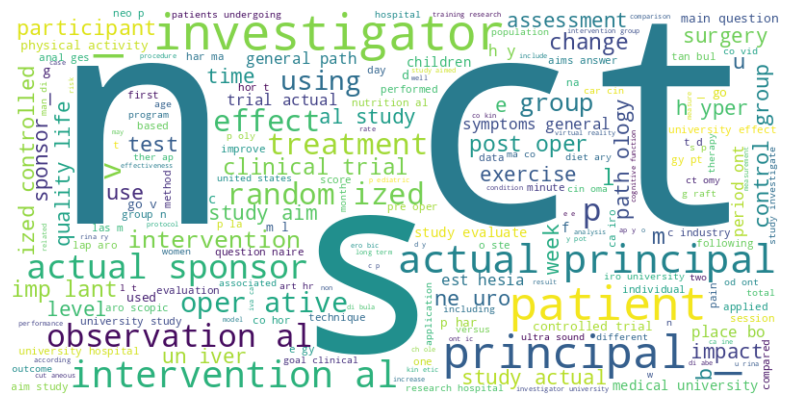

In [55]:
from transformers import BertTokenizer, BertForTokenClassification
from transformers import pipeline
import torch
import pandas as pd

# Ładowanie modelu BioBERT i tokenizera
tokenizer = BertTokenizer.from_pretrained('dmis-lab/biobert-v1.1')
model = BertForTokenClassification.from_pretrained('dmis-lab/biobert-v1.1')

# Utworzenie pipeline NER
nlp_ner = pipeline("ner", model=model, tokenizer=tokenizer)



# Połączenie tekstu ze wszystkich kolumn w DataFrame
all_text = df_selected_columns.select_dtypes(include=['object']).apply(
    lambda row: ' '.join([str(x) for x in row.dropna().values]), axis=1 # Convert each element to string before joining
)

# Ekstrakcja jednostek medycznych dla każdego wiersza
medical_entities = []
for text in all_text:
    entities = nlp_ner(text)
    medical_entities.extend([ent['word'] for ent in entities])

# Tworzenie tekstu z jednostek medycznych
medical_entities_text = ' '.join(medical_entities)

# Tworzenie Word Cloud
from wordcloud import WordCloud
import matplotlib.pyplot as plt

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(medical_entities_text)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [62]:
!pip install scispacy
!pip install spacy==3.7.5
!pip install https://huggingface.co/allenai/scibert_scivocab_cased/resolve/main/scibert_scivocab_cased.tar.gz

  ERROR: HTTP error 404 while getting https://huggingface.co/allenai/scibert_scivocab_cased/resolve/main/scibert_scivocab_cased.tar.gz
ERROR: Could not install requirement https://huggingface.co/allenai/scibert_scivocab_cased/resolve/main/scibert_scivocab_cased.tar.gz because of HTTP error 404 Client Error: Not Found for url: https://huggingface.co/allenai/scibert_scivocab_cased/resolve/main/scibert_scivocab_cased.tar.gz for URL https://huggingface.co/allenai/scibert_scivocab_cased/resolve/main/scibert_scivocab_cased.tar.gz


In [63]:
import spacy
import scispacy
from collections import Counter

# Download the model data if it's not already downloaded
# Load the SciSpacy model
nlp = spacy.load("en_core_sci_md")



# Example function to process NER and count entity words
def extract_and_count_entities(text):
    # Process the text with the NER model
    doc = nlp(text)
    # Extract all entities (words) and their labels
    entities = [ent.text for ent in doc.ents]
    return entities

# Apply the function to your text column
df_selected_columns['NER_results'] = df_selected_columns['your_text_column'].apply(extract_and_count_entities)

# Now, to sum the NER words across all rows
all_entities = sum(df_selected_columns['NER_results'], [])  # Flatten the list of lists
entity_counts = Counter(all_entities)  # Count occurrences of each NER word

# Display the most common NER words
print(entity_counts.most_common())

OSError: [E050] Can't find model 'en_core_sci_md'. It doesn't seem to be a Python package or a valid path to a data directory.

Spróbujmy zrobić chmurę słów z kolumn o tekstach dłuższych niż 10

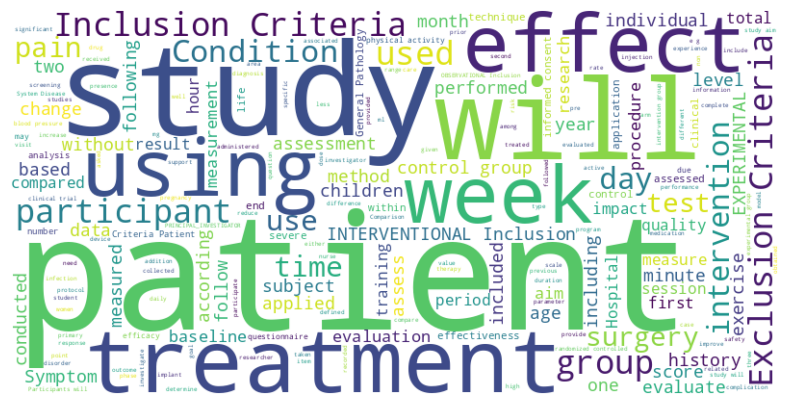

In [ ]:
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Załadowanie danych do DataFrame
# Zakładamy, że DataFrame `df` zawiera wiele kolumn tekstowych

# 1. Łączenie tekstu z wszystkich kolumn w jeden dokument (jeden ciąg tekstowy)
text = ' '.join(df_long_text.apply(lambda row: ' '.join(row.dropna().astype(str)), axis=1))

# 2. Tworzenie chmury słów
wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis', max_words=200).generate(text)

# 3. Wyświetlanie chmury słów
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

## Named Entity Recognition

In [47]:
import pandas as pd
import spacy

# Załaduj model językowy
nlp = spacy.load("en_core_web_sm")

# Przykład - zakładamy, że `df` to DataFrame z wieloma kolumnami tekstowymi
# Sklejamy wszystkie teksty w jedną listę
texts = df_selected_columns.apply(lambda row: ' '.join(row.dropna().astype(str)), axis=1)

# Pętla do przeprowadzania NER na każdej frazie tekstowej
all_entities = []
for i, doc in enumerate(nlp.pipe(texts, disable=["tagger", "parser"])):  # pipe przyspiesza przetwarzanie dużych danych
    for ent in doc.ents:
        all_entities.append([i, ent.text, ent.label_])  # dodaj indeks dokumentu

# Konwertowanie wyników do DataFrame, aby wyświetlić je bardziej przejrzyście
entities_df = pd.DataFrame(all_entities, columns=["Document_Index", "Entity", "Label"])
print(entities_df.head())

/usr/local/lib/python3.10/dist-packages/spacy/pipeline/lemmatizer.py:211: UserWarning: [W108] The rule-based lemmatizer did not find POS annotation for one or more tokens. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
  warnings.warn(Warnings.W108)


   Document_Index                                      Entity     Label
0               0  policlinico universitario agostino gemelli       ORG
1               0                                       weeks      DATE
2               0                                         sph  CARDINAL
3               0                                        rome       GPE
4               0                                       italy       GPE


In [48]:
entity_counts = entities_df['Label'].value_counts()
print(entity_counts)

Label
CARDINAL       38116
GPE             2504
DATE            2130
ORG             1761
MONEY           1230
PRODUCT         1145
PERSON          1102
WORK_OF_ART     1065
ORDINAL          784
FAC              779
TIME             462
NORP             432
QUANTITY         253
PERCENT           69
LAW               62
LOC               42
EVENT              6
LANGUAGE           2
Name: count, dtype: int64


In [51]:
import pandas as pd

# Przyjmujemy, że masz już DataFrame `df` z danymi tekstowymi

# Obliczanie średniej długości tekstu dla poszczególnych kolumn
average_text_length = {}

for col in df_selected_columns.columns:
    # Filtruje tylko wartości tekstowe, ignorując np. wartości numeryczne i braki danych (NaN)
    text_data = df_selected_columns[col].dropna().apply(lambda x: len(str(x)) if isinstance(x, str) else 0)
    average_text_length[col] = text_data.mean()  # Oblicza średnią długość tekstu

# Sortowanie słownika według średniej długości tekstu malejąco
sorted_avg_text_length = dict(sorted(average_text_length.items(), key=lambda item: item[1], reverse=True))

# Wyprintowanie posortowanych wyników
for col, avg_len in sorted_avg_text_length.items():
    print(f"Średnia długość tekstu dla kolumny '{col}': {avg_len:.2f}")



Średnia długość tekstu dla kolumny 'descriptionModule.briefSummary': 531.84
Średnia długość tekstu dla kolumny 'armsInterventionsModule.interventions_0_description': 188.91
Średnia długość tekstu dla kolumny 'identificationModule.officialTitle': 113.83
Średnia długość tekstu dla kolumny 'identificationModule.briefTitle': 79.21
Średnia długość tekstu dla kolumny 'outcomesModule.primaryOutcomes_0_measure': 36.55
Średnia długość tekstu dla kolumny 'contactsLocationsModule.locations_0_facility': 32.67
Średnia długość tekstu dla kolumny 'identificationModule.organization.fullName': 27.70
Średnia długość tekstu dla kolumny 'sponsorCollaboratorsModule.leadSponsor.name': 26.42
Średnia długość tekstu dla kolumny 'armsInterventionsModule.interventions_0_name': 24.04
Średnia długość tekstu dla kolumny 'armsInterventionsModule.armGroups_0_label': 22.97
Średnia długość tekstu dla kolumny 'outcomesModule.secondaryOutcomes_0_measure': 19.90
Średnia długość tekstu dla kolumny 'conditionBrowseModule.br

Jeszcze raz zrobię Word of Cloud z kolumnami gdzie srednia dlugisc tekstu > 50  

In [53]:
import pandas as pd

# Zakładamy, że masz już załadowany DataFrame `df_flat_2`
# df_flat_2 = pd.read_csv('twoj_plik.csv')  # Przykład wczytania danych

# Krok 1: Wykluczenie kolumn o typach danych bool i datetime
excluded_types = ['bool', 'datetime64[ns]', 'datetime64[ns, UTC]']

# Wybieramy kolumny, które są typu object lub string, ale nie są typu bool ani datetime
text_columns = df_selected_columns.select_dtypes(include=['object', 'string']).columns.tolist()

# Wykluczamy kolumny, które są typu bool lub datetime
filtered_text_columns = [
    col for col in text_columns
    if not pd.api.types.is_bool_dtype(df_long_text[col]) and not pd.api.types.is_datetime64_any_dtype(df_long_text[col])
]

# Krok 2: Obliczenie średniej długości tekstu dla każdej z wybranych kolumn
average_text_length = {}

for col in filtered_text_columns:
    # Filtrujemy tylko wartości tekstowe, ignorując NaN i inne typy danych
    text_data = df_long_text[col].dropna().apply(lambda x: len(str(x)) if isinstance(x, str) else 0)
    avg_len = text_data.mean()
    average_text_length[col] = avg_len

# Krok 3: Konwersja wyników do Series i filtrowanie na podstawie progu średniej długości
min_avg_length = 10  # Ustal minimalny próg średniej długości tekstu

avg_text_length_series = pd.Series(average_text_length)

# Filtrowanie kolumn, których średnia długość tekstu jest większa niż min_avg_length
filtered_columns = avg_text_length_series[avg_text_length_series > min_avg_length]

# Krok 4: Sortowanie wyników od największej do najmniejszej średniej długości tekstu
sorted_filtered_columns = filtered_columns.sort_values(ascending=False)

# Wyprintowanie posortowanych wyników
print("Kolumny z dłuższym tekstem (posortowane od największej do najmniejszej średniej długości):")
for col, avg_len in sorted_filtered_columns.items():
    print(f"- {col}: średnia długość = {avg_len:.2f} znaków")

# Krok 5: Utworzenie nowego DataFrame z przefiltrowanymi i posortowanymi kolumnami
filtered_df = df_long_text[sorted_filtered_columns.index]

# Wyświetlenie pierwszych kilku wierszy nowego DataFrame
#print("\nNowy DataFrame z przefiltrowanymi kolumnami:")
#print(filtered_df.head())


NameError: name 'df_long_text' is not defined

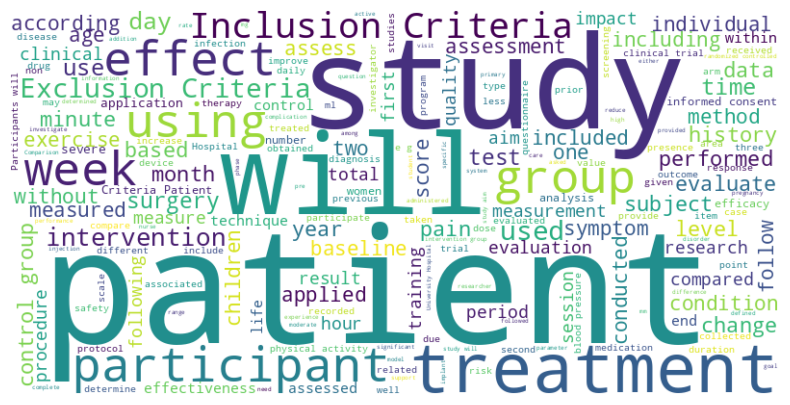

In [ ]:
text = ' '.join(.apply(lambda row: ' '.join(row.dropna().astype(str)), axis=1))

# 2. Tworzenie chmury słów
wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis', max_words=200).generate(text)

# 3. Wyświetlanie chmury słów
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [ ]:
import pandas as pd
from textblob import TextBlob

# Zakładamy, że `df` to Twój DataFrame z kilkudziesięcioma kolumnami
# Wybierzmy tylko kolumny tekstowe
text_columns = filtered_df.select_dtypes(include=['object', 'string']).columns

# Utwórz nowy DataFrame do przechowywania wyników analizy sentymentu
sentiment_results = pd.DataFrame(index=filtered_df.index)

# Analiza sentymentu dla każdej kolumny tekstowej
for col in text_columns:
    # Sprawdzamy, czy kolumna zawiera tekst, a następnie obliczamy sentyment
    sentiment_results[f'{col}_sentiment'] = filtered_df[col].dropna().apply(lambda x: TextBlob(str(x)).sentiment.polarity if isinstance(x, str) else 0)
    sentiment_results[f'{col}_sentiment_category'] = sentiment_results[f'{col}_sentiment'].apply(lambda x: 'positive' if x > 0 else ('negative' if x < 0 else 'neutral'))

# Wyświetl pierwsze kilka wierszy wyników analizy sentymentu
#print(sentiment_results.head())

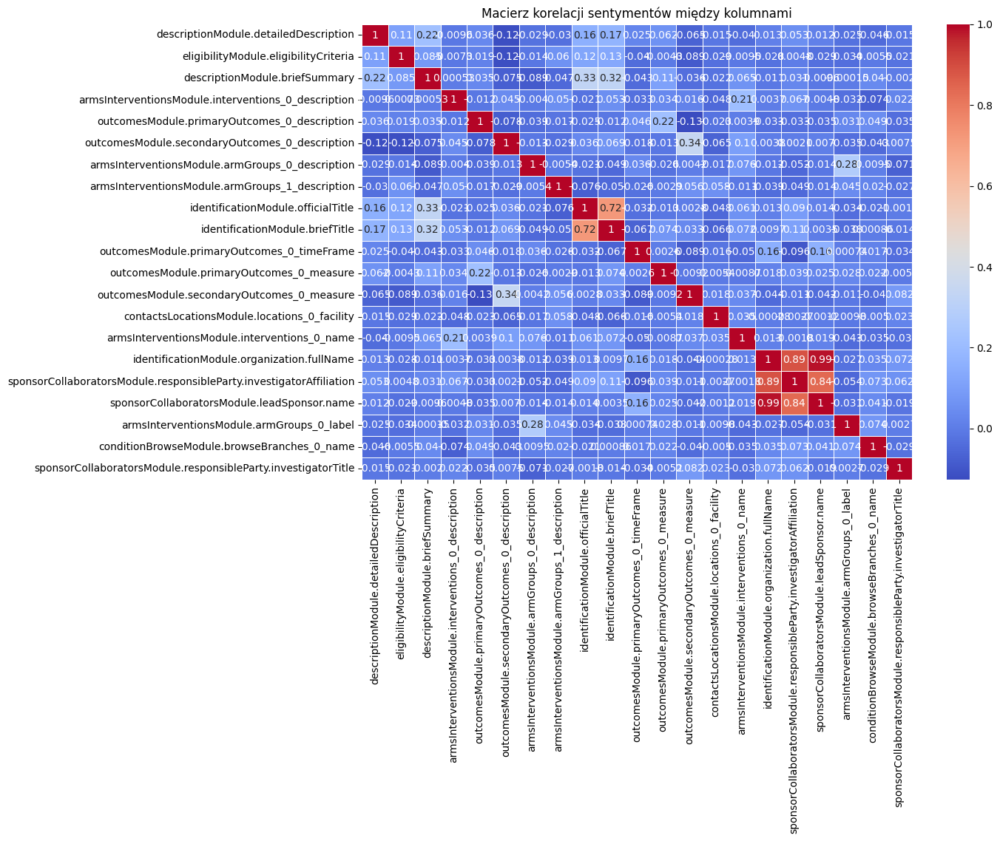

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Zakładamy, że już przeprowadzono analizę sentymentu i wyniki są w sentiment_results

# Wybieramy kolumny, które zawierają wyniki sentymentu dla różnych kolumn z df_filtered
# Będą to kolumny typu <col>_sentiment
sentiment_columns = [f'{col}_sentiment' for col in filtered_df.select_dtypes(include=['object', 'string']).columns]

# Tworzymy DataFrame z wynikami sentymentów (jeśli jeszcze tego nie zrobiono)
sentiment_scores = pd.DataFrame({col: sentiment_results[f'{col}_sentiment'] for col in filtered_df.select_dtypes(include=['object', 'string']).columns})

# Obliczamy korelację między wynikami sentymentów
correlation_matrix = sentiment_scores.corr()

# Rysowanie mapy ciepła (heatmap)
plt.figure(figsize=(12, 8))  # Ustalamy rozmiar wykresu
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Macierz korelacji sentymentów między kolumnami')
plt.show()


## Named entity recognition na pełnym pliku rozpłaszczoym

In [ ]:
df_flat_2.head()

,identificationModule.organization.fullName,identificationModule.organization.class,identificationModule.briefTitle,identificationModule.officialTitle,statusModule.statusVerifiedDate,statusModule.overallStatus,statusModule.expandedAccessInfo.hasExpandedAccess,statusModule.startDateStruct.date,statusModule.startDateStruct.type,statusModule.primaryCompletionDateStruct.date,...,referencesModule.seeAlsoLinks_22_label,referencesModule.seeAlsoLinks_22_url,referencesModule.seeAlsoLinks_23_label,referencesModule.seeAlsoLinks_23_url,referencesModule.seeAlsoLinks_24_label,referencesModule.seeAlsoLinks_24_url,referencesModule.seeAlsoLinks_25_label,referencesModule.seeAlsoLinks_25_url,referencesModule.seeAlsoLinks_26_label,referencesModule.seeAlsoLinks_26_url
0,Fondazione Policlinico Universitario Agostino ...,OTHER,Single-Port Hysterectomy (R-SPH) Using the Da ...,"Feasibility, Safety, and Efficacy of Robotic S...",2024-11,COMPLETED,False,2024-06-26,ACTUAL,2024-10-01,...,Related Info,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4...,Related Info,https://pubmed.ncbi.nlm.nih.gov/6507532/,Related Info,https://pubmed.ncbi.nlm.nih.gov/1630743/,Related Info,https://pubmed.ncbi.nlm.nih.gov/9917943/,Related Info,https://pubmed.ncbi.nlm.nih.gov/8912990/
1,Kafrelsheikh University,OTHER,Prophylactic Mirtazapine and Different Doses o...,Role of Prophylactic Mirtazapine and Different...,2024-11,COMPLETED,False,2023-01-01,ACTUAL,2024-09-25,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Region Stockholm,OTHER_GOV,Feasibility of Accessible Video Mental Healthc...,Feasibility of Accessible Video Mental Healthc...,2024-08,COMPLETED,False,2022-12-01,ACTUAL,2023-06-30,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Selcuk University,OTHER,The Effect of the Intrapartum Care Model Given...,The Effect of the Intrapartum Care Model Given...,2024-11,COMPLETED,False,2023-09-01,ACTUAL,2023-12-01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Nanchang University,OTHER,Raspberry Ketone Intake Upregulates Circulatin...,The Effect of Raspberry Ketone Intake on Plasm...,2023-11,COMPLETED,False,2024-01-10,ACTUAL,2024-05-15,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
import pandas as pd
import spacy

# Załaduj model językowy
nlp = spacy.load("en_core_web_sm")

# Przykład - zakładamy, że `df` to DataFrame z wieloma kolumnami tekstowymi
# Sklejamy wszystkie teksty w jedną listę
texts = df_flat_2.apply(lambda row: ' '.join(row.dropna().astype(str)), axis=1)

# Pętla do przeprowadzania NER na każdej frazie tekstowej
all_entities = []
for i, doc in enumerate(nlp.pipe(texts, disable=["tagger", "parser"])):  # pipe przyspiesza przetwarzanie dużych danych
    for ent in doc.ents:
        all_entities.append([i, ent.text, ent.label_])  # dodaj indeks dokumentu

# Konwertowanie wyników do DataFrame, aby wyświetlić je bardziej przejrzyście
entities_df_all = pd.DataFrame(all_entities, columns=["Document_Index", "Entity", "Label"])
print(entities_df_all.head())

/usr/local/lib/python3.10/dist-packages/spacy/pipeline/lemmatizer.py:211: UserWarning: [W108] The rule-based lemmatizer did not find POS annotation for one or more tokens. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
  warnings.warn(Warnings.W108)


   Document_Index                                        Entity Label
0               0  Efficacy of Robotic Single-Port Hysterectomy   ORG
1               0                                       2024-11  DATE
2               0                                    2024-06-26  DATE
3               0                                    2024-10-01  DATE
4               0                                    2024-10-15  DATE


In [ ]:
entity_counts = entities_df_all['Label'].value_counts()
print(entity_counts)

Label
ORG            27645
DATE           24234
CARDINAL       21309
PERSON         15713
GPE             6027
TIME            3280
NORP            1669
ORDINAL         1430
PERCENT         1381
QUANTITY        1369
WORK_OF_ART     1075
FAC             1069
PRODUCT         1017
LOC              346
MONEY            206
LAW              198
EVENT            184
LANGUAGE          66
Name: count, dtype: int64


In [ ]:
import pandas as pd
from collections import Counter
import spacy

# Załaduj model spaCy
nlp = spacy.load("en_core_web_sm")  # użyj modelu dla języka polskiego; zmień na odpowiedni model dla innych języków

# Przekształć teksty jednostek do podstawowych form i zbierz najczęstsze słowa
def get_most_common_word(texts):
    tokens = []
    for doc in nlp.pipe(texts, disable=["ner"]):  # szybkie przetwarzanie zbiorowe bez rozpoznawania jednostek
        tokens.extend([token.lemma_ for token in doc if token.is_alpha and not token.is_stop])  # lematyzacja, usuwanie stopwords
    most_common_word = Counter(tokens).most_common(1)
    return most_common_word[0][0] if most_common_word else None

# Policz występowania poszczególnych etykiet
entity_counts = entities_df_all['Label'].value_counts()

# Znajdź najczęściej występujące słowo w każdej kategorii NER z tokenizacją i lematyzacją
most_common_words = {}
for label in entity_counts.index:
    # Wybierz wszystkie teksty dla danej etykiety
    words = entities_df_all[entities_df_all['Label'] == label]['Entity']
    most_common_words[label] = get_most_common_word(words)

# Utwórz DataFrame z wynikami
entity_counts_df = entity_counts.reset_index()
entity_counts_df.columns = ['Label', 'Count']
entity_counts_df['Most_Common_Word'] = entity_counts_df['Label'].map(most_common_words)

print(entity_counts_df)



          Label  Count Most_Common_Word
0           ORG  27645       University
1          DATE  24234             week
2      CARDINAL  21309               II
3        PERSON  15713          disease
4           GPE   6027       anesthesia
5          TIME   3280           minute
6          NORP   1669          turkish
7       ORDINAL   1430           second
8       PERCENT   1381    approximately
9      QUANTITY   1369               ml
10  WORK_OF_ART   1075         Criteria
11          FAC   1069         Criteria
12      PRODUCT   1017                J
13          LOC    346    Mediterranean
14        MONEY    206               ml
15          LAW    198              Sep
16        EVENT    184       Depression
17     LANGUAGE     66          English


## Word Embedings

pracujemy na df_selected_columns

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
<ipython-input-40-0261ffc719ef>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_columns['tokens'] = df_selected_columns[text_columns].apply(
<ipython-input-40-0261ffc719ef>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_columns['vector_avg'] = df_selected_columns['tokens'].apply(lambda tokens: document_vector(tokens, model))


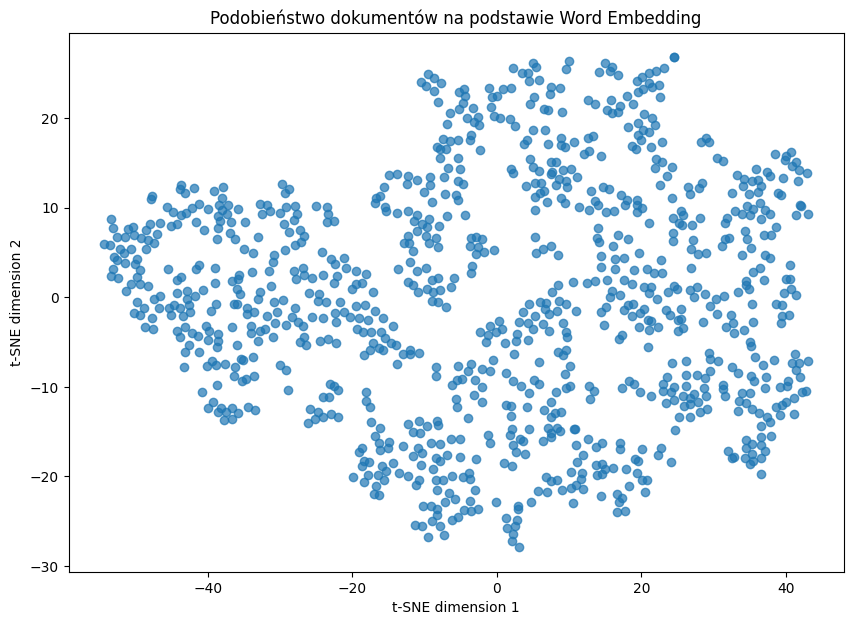

In [40]:
import pandas as pd
from gensim.models import Word2Vec
from nltk.tokenize import word_tokenize
import nltk
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

# Pobieramy niezbędne dane dla NLTK
nltk.download('punkt')

# Zakładamy, że `df_selected_columns` to Twój DataFrame z kolumnami tekstowymi
# Wybieramy kolumny tekstowe i tokenizujemy zawarte w nich dane
text_columns = df_selected_columns.select_dtypes(include=['object']).columns
df_selected_columns['tokens'] = df_selected_columns[text_columns].apply(
    lambda row: [word for col in row for word in word_tokenize(str(col).lower()) if pd.notnull(col)],
    axis=1
)

# Trenujemy model Word2Vec na zebranych tokenach
model = Word2Vec(sentences=df_selected_columns['tokens'], vector_size=100, window=5, min_count=1, workers=4)

# Obliczamy średnie wektory dla każdego dokumentu
def document_vector(tokens, model):
    # Używamy średniego wektora dla słów w dokumencie
    return np.mean([model.wv[word] for word in tokens if word in model.wv], axis=0)

df_selected_columns['vector_avg'] = df_selected_columns['tokens'].apply(lambda tokens: document_vector(tokens, model))

# Usuwamy wiersze bez wektorów (na wypadek, gdyby jakieś dokumenty miały pustą listę słów)
df_vectors = df_selected_columns.dropna(subset=['vector_avg'])

# Tworzymy macierz wektorów
doc_vectors = np.vstack(df_vectors['vector_avg'].values)

# Redukcja wymiarowości za pomocą t-SNE
tsne = TSNE(n_components=2, random_state=42)
reduced_vectors = tsne.fit_transform(doc_vectors)

# Wizualizacja dokumentów
plt.figure(figsize=(10, 7))
plt.scatter(reduced_vectors[:, 0], reduced_vectors[:, 1], alpha=0.7)
plt.title('Podobieństwo dokumentów na podstawie Word Embedding')
plt.xlabel('t-SNE dimension 1')
plt.ylabel('t-SNE dimension 2')
plt.show()


Grupy punktów: Punkty, które znajdują się blisko siebie na wykresie, reprezentują dokumenty o podobnej treści, ponieważ ich wektory są podobne. Grupy mogą wskazywać na klastry dokumentów związanych z podobnym tematem lub kontekstem.

Odległości między punktami: Im większa odległość między punktami, tym mniej podobne są dokumenty. Dokumenty o zupełnie innej tematyce lub słownictwie będą dalej od siebie.

t-SNE1 i t-SNE2: Wymiary t-SNE1 i t-SNE2 nie mają bezpośredniego znaczenia interpretacyjnego. Reprezentują po prostu nową przestrzeń, w której zachowano relatywne odległości między dokumentami, ale sama numeracja osi nie niesie konkretnego znaczenia.

In [42]:
df_selected_columns.to_csv('df_selected_columns.csv', index=False)

<ipython-input-43-8bfde11e67d2>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_columns.loc[df_selected_columns['vector_avg'].notna(), 'cluster'] = kmeans.labels_


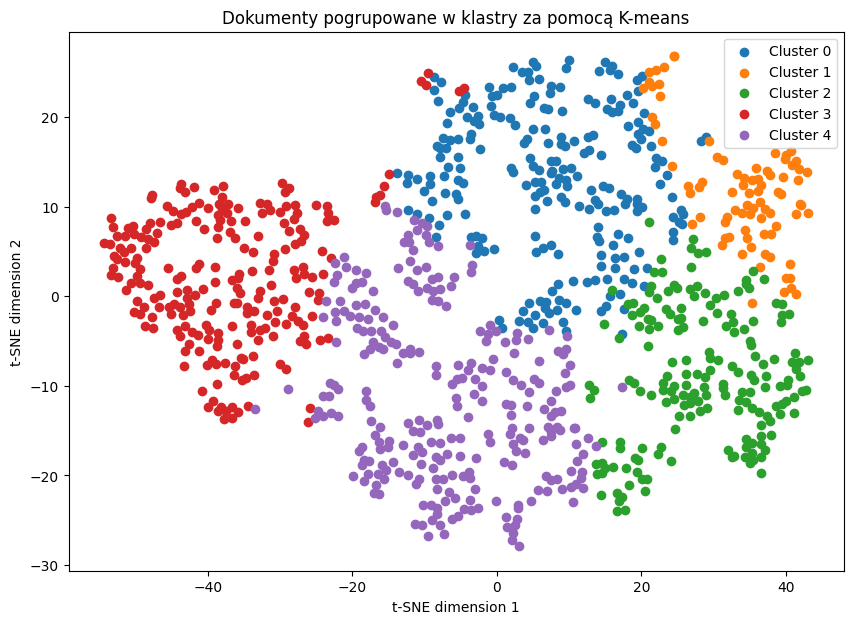

In [43]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Konwersja kolumny 'vector_avg' na macierz (lista wektorów dokumentów)
doc_vectors = np.vstack(df_selected_columns['vector_avg'].dropna().values)

# Definiujemy liczbę klastrów. Można zacząć od arbitralnej wartości, np. 5.
n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(doc_vectors)

# Dodajemy etykiety klastrów do DataFrame
df_selected_columns.loc[df_selected_columns['vector_avg'].notna(), 'cluster'] = kmeans.labels_

# Wizualizacja klastrów z t-SNE
from sklearn.manifold import TSNE

# Redukcja wymiarowości do 2D
tsne = TSNE(n_components=2, random_state=42)
reduced_vectors = tsne.fit_transform(doc_vectors)

# Rysowanie wykresu z kolorami odpowiadającymi klastrom
plt.figure(figsize=(10, 7))
for i in range(n_clusters):
    cluster_points = reduced_vectors[kmeans.labels_ == i]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {i}')

plt.title('Dokumenty pogrupowane w klastry za pomocą K-means')
plt.xlabel('t-SNE dimension 1')
plt.ylabel('t-SNE dimension 2')
plt.legend()
plt.show()


Cosinusowa miara podobieństwa dla każdego klastra

In [44]:
from sklearn.metrics.pairwise import cosine_similarity

# Obliczamy średni wektor dla każdego klastra
cluster_centers = []
for cluster in range(n_clusters):
    cluster_vectors = np.vstack(df_selected_columns[df_selected_columns['cluster'] == cluster]['vector_avg'].dropna())
    cluster_centers.append(cluster_vectors.mean(axis=0))

# Obliczamy macierz podobieństwa kosinusowego między klastrami
similarity_matrix = cosine_similarity(cluster_centers)

# Wyświetlamy macierz podobieństwa
print("Cosine Similarity between cluster centers:")
print(similarity_matrix)

Cosine Similarity between cluster centers:
[[0.99999994 0.9998108  0.9937227  0.99798185 0.9944883 ]
 [0.9998108  1.         0.99146795 0.9965968  0.99234885]
 [0.9937227  0.99146795 1.         0.9987785  0.9999633 ]
 [0.99798185 0.9965968  0.9987785  0.9999997  0.99911773]
 [0.9944883  0.99234885 0.9999633  0.99911773 0.9999999 ]]


Interpretacja tematyczna: Tak wysokie podobieństwo między centroidami klastrów wskazuje, że tematyka w różnych klastrach jest bardzo zbliżona. Oznacza to, że dokumenty przypisane do różnych klastrów mają ze sobą dużo wspólnego. Może to sugerować:

Brak wyraźnych granic tematycznych między klastrami.
Zbyt mało różnorodności w danych, co prowadzi do klastrów o podobnym wektorze centralnym.
Możliwe, że liczba klastrów jest za duża jak na rzeczywistą różnorodność w danych (możesz rozważyć zmniejszenie liczby klastrów).

Analiza tematyczna z wykorzystaniem TF-IDF

In [45]:
from sklearn.feature_extraction.text import TfidfVectorizer

for cluster in range(n_clusters):
    # Pobieramy teksty dokumentów z danego klastra
    cluster_texts = df_selected_columns[df_selected_columns['cluster'] == cluster]['tokens'].apply(' '.join)
    vectorizer = TfidfVectorizer(max_features=10)  # Wybieramy top 10 słów
    tfidf_matrix = vectorizer.fit_transform(cluster_texts)
    keywords = vectorizer.get_feature_names_out()
    print(f"Cluster {cluster} top TF-IDF keywords:", keywords)

Cluster 0 top TF-IDF keywords: ['actual' 'clinical' 'hospital' 'interventional' 'nct' 'observational'
 'patients' 'principal_investigator' 'study' 'university']
Cluster 1 top TF-IDF keywords: ['actual' 'effect' 'hospital' 'interventional' 'nct' 'patients'
 'randomized' 'study' 'treatment' 'university']
Cluster 2 top TF-IDF keywords: ['actual' 'exercise' 'group' 'intervention' 'nct' 'pain' 'patients'
 'study' 'training' 'university']
Cluster 3 top TF-IDF keywords: ['actual' 'group' 'hospital' 'interventional' 'nct' 'patients' 'study'
 'treatment' 'university' 'using']
Cluster 4 top TF-IDF keywords: ['actual' 'group' 'intervention' 'interventional' 'nct' 'pain' 'patients'
 'study' 'treatment' 'university']
